# Расчёт стропильной системы

## Сбор нагрузок

На крышу действуют постоянные $P_{d}$ и временные (длительные $P_{l}$ , кратковременные $P_{t}$ , особые $P_{s}$ ) нагрузки. Постоянные нагрузки: от веса частей сооружения, в том числе несущих строительных конструкций. Временные кратковременные нагрузки: от веса людей и оборудования во время производства работ на крыше. Временные длительные нагрузки: снеговая нагрузка.

### Постоянные нагрузки

Нормативное значение равномерно распределенных постоянных нагрузок определяется по формуле (\ref{eq1}): 

\begin{align}
q_{H} = t\cdot\gamma\tag{1}\label{eq1} \text{,}& \\
\text{где }&t \text{ – толщина конструкции;} \\
&\gamma \text{ – удельный вес конструкции.}
\end{align}

Расчетное значение нагрузок определяется по формуле (2): 

\begin{align}
q_{p} = q_{H}\cdot\gamma_{f}\tag{2}\label{eq2} \text{,}& \\
\text{где }&\gamma_{f} \text{ – коэффициент надёжности по нагрузке.} \\
\end{align}

Коэффициент надёжности по нагрузке для деревянных конструкций принимается 1.1 в соответствии с СП 20.13330.2016, Таблица 7.1.

Постоянная нагрузка от веса стропильной системы учитывается расчётной моделью, где указана геометрия элементов и их плотность. Дополнительно необходимо задать нагрузку от обрешётки, контробрешётки, покрытия крыши (металлочерепица). Нагрузка от одного квадратного метра кровли рассчитывается из следующих соображений: 

* обрешётка: доска 100х25 мм. Три доски на кв. м (шаг 350 мм). Плотность 0.6 $кг/л$;
* контробрешётка: брусок 50х50 мм. Два бруска на кв. м (шаг стропил 0.6 м. Плотность 0.6 $кг/л$;
* металлочерепица. Удельный вес 5 кг/$м^{2}$.


In [1]:
# Common settings
density = 0.6 # kg/l
gamma_f = 1.1
g       = 9.8 # m/s**2

# Lattice
len_l    = 100 # sm
width_l  = 10  # sm
thick_l  = 2.5 # sm
count_l  = 3

# Counterlattice
len_cl   = 100 # sm
width_cl = 5   # sm
thick_cl = 5   # sm
count_cl = 2

# Metaltile
m_mt = 5  # kg

# Resust
v_l = len_l*width_l*thick_l*count_l
v_cl = len_cl*width_cl*thick_cl*count_cl

m_wood = (v_l + v_cl)*density/1000

m = m_wood + m_mt
q = m*g*gamma_f

print('specific gravity:', m, 'kg/m^2')
print('constant loads  :', round(q, 2), 'N/m^2')

specific gravity: 12.5 kg/m^2
constant loads  : 134.75 N/m^2


### Снеговые нагрузки

Снеговые нагрузки вычисляются по формуле (\ref{eq3}):

$
\begin{align}
S_{0} = \mu \cdot S_{g} \tag{3}\label{eq3} \text{,}& \\
\text{где } &\mu \text{ – коэффициент формы, учитывающий переход от веса снегового покрова земли к} \\ &\text{снеговой нагрузке на покрытие, принимаемый в соответствии со СНиП 2.01.07-85 (Приложение Б) и СП 20.13330.2016, п.10.4.} \\
&S_{g} \text{ – нормативное значение веса снегового покрова на 1 м2 горизонтальной поверхности земли.}
\end{align}
$

Согласно СНиП 2.01.07-85 для двускатных кровель значение $\mu$ определяется:

* 1 для $\alpha \le 30^\circ$;
* 0 для $\alpha \ge 60^\circ$;
* промежуточные значения определяются линейной интерполяцией.

Для угла $\alpha$ в диапазоне $30^\circ..60^\circ$ значение, вычисляемое линейной интерполяцией будет определяться по формуле (\ref{eq4}):

$
\mu = 1 -\frac{1}{30} \cdot (\alpha - 30) \tag{4} \label{eq4}
$

В проектируемой конструкции стропильной системы угол $\alpha = 36^\circ$. Исходя из этого, $\mu$:

In [1]:
alpha = 33
mu = 1 -1.0/30*(alpha-30)
print('mu:', mu)

mu: 0.9


Нормативное значение веса снегового покрова $S_{g}$ на $1 м^2$ горизонтальной поверхности земли для сибирского региона составляет $2 кПа$ (4-я категория снеговых регионов), т.е. $2 кН/м^2$. Коэффициент надёжности для снеговых нагрузок $\gamma_{f}$ в соответствии со СНиП 2.01.07-85 п.10.12 состаляет $1.4$.

Таким образом, результирующая снеговая нагрузка:

In [2]:
# Snow load
Sg           = 2e3
gamma_f_snow = 1.4

S0 = mu*Sg*gamma_f_snow

print('Snow load Sg:', S0/1000, 'kH/m^2')

Snow load Sg: 2.52 kH/m^2


## Выбор схемы и конструктивный расчёт стропильной системы

Различные конструкции фермы стропильной системы при заданных внешних нагрузках рассмотрены в [этом документе](rafter-system-design-model-33deg.ipynb). На основании полученных результатов можно сделать вывод, что наиболее удовлетворительным является вариант наслонной стропильной системы со стойкой и подкосами. Расчёт производится для угла наклона левой стропильной ноги в $33°$.

Для завершающего расчёта элементов стропильной системы необходимо проверить и при необходимости скорректировать характеристики конструкционных элементов — сечения, материалы и т.д.



### Геометрия стропильной фермы


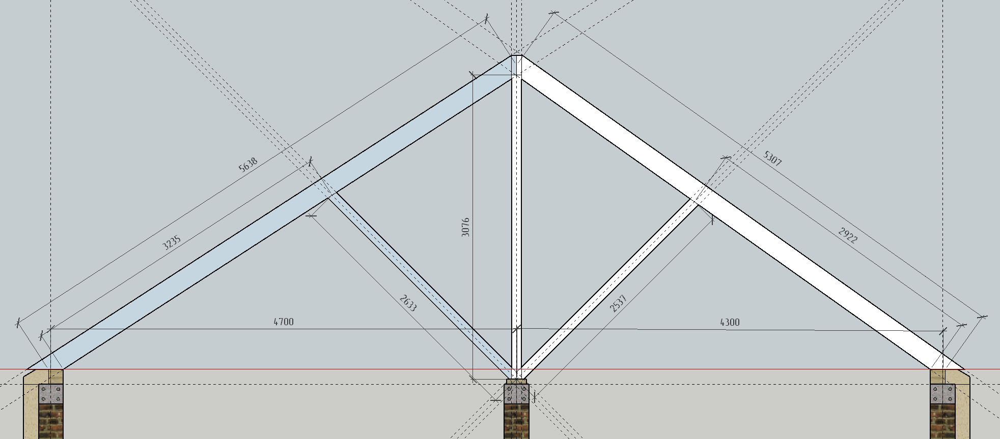


### Материалы:

* стропила: сосна, 200x50 мм.
* подкосы: сосна, 100х100 мм.
* стойка: сосна, 100х100 мм.

### Нагрузки

* Собственный вес: $134.75 Н/м^{2}$
* Снеговая: $2520 Н/м^{2}$

Предполагается шаг стропильных ферм 1 м.

### Требования по прочности, устойчивости

Предельные прогибы для балок, ферм, ригелей, прогонов, плит, настилов:
* $l \le 1 м : 1/120$
* $l = 3 м : 1/150$
* $l = 6 м : 1/200$
* $l = 24 м : 1/250$
* $l \ge 36 м : 1/300$

Предельный прогиб для стропил длиной 5.5..6 м принимается $1/200$.

In [3]:
l1 = 3235 # left rafter len 
l2 = 2922 # right rafter len 

k = 1.0/200

md1 = l1*k
md2 = l2*k

print('Maximum deflection for rafter', l1, 'mm:', int(round(md1, 0)), 'mm')
print('Maximum deflection for rafter', l2, 'mm:', int(round(md2, 0)), 'mm')

Maximum deflection for rafter 3235 mm: 16 mm
Maximum deflection for rafter 2922 mm: 15 mm


Несмотря на утверждения в ряде источников, что наслонная стропильная система не создаёт распирающего усилия на стены, моделирование показало, что это не так. Наличие распирающего усилия вполне логично, т.к. в стропильной ноге всегда присутствует продольная сила, и если стропильная нога имеет шарнирно-неподвижное крепление — т.е. по осям $X$ и $Z$, то эта продольная сила раскладывается на две составляющие, действующие по указанным осям. Чем меньше угол наклона стропильной ноги к горизонту, тем больше составляющая по оси $X$, т.е. распорное усилие.

### Эпюры прогибов и распорных усилий

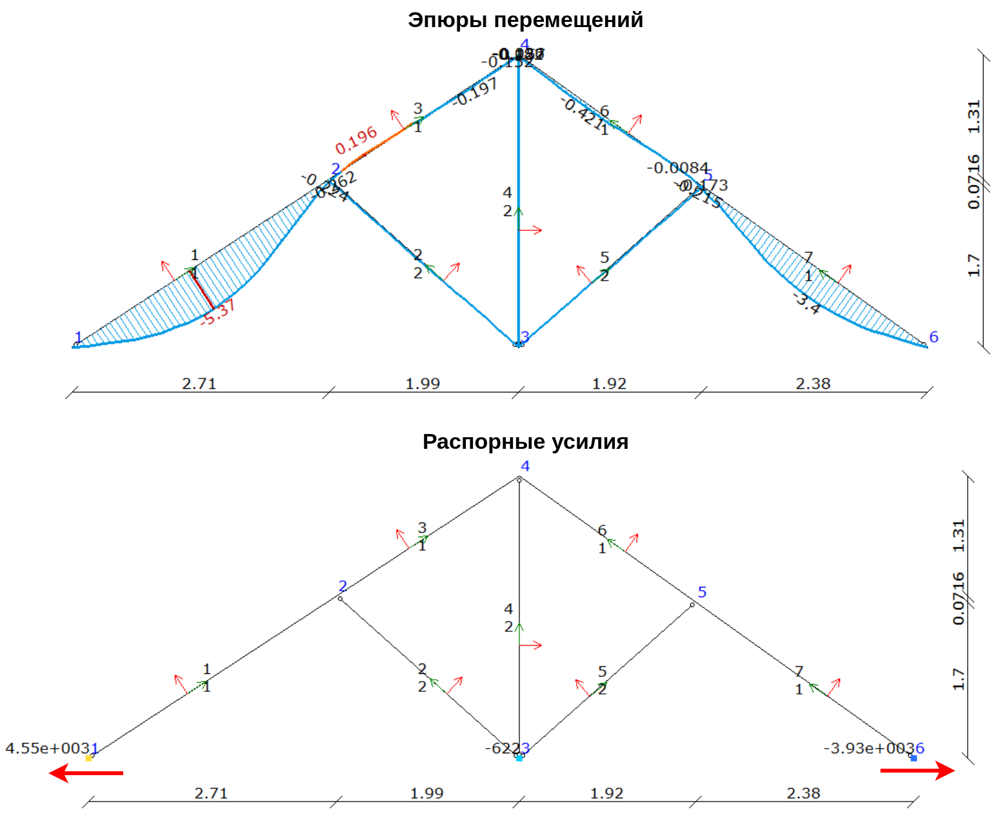

Анализ эпюр показывает, что максимальный прогиб для самого нагруженных элементов — это нижние сегменты стропильных ног, — составляет $5.37$ и $3.4 мм$ соответственно, при предельных значениях $16$ и $15 мм$.

При этом распорные усилия составляют $4.55$ и $3.93 кН$ (или порядка $450$ и $390 кгс$). Учитывая, что таких стропильных ферм на крыше будет 9 шт. (с шагом $1 м$), то суммарное усилие на стену составляет порядка $4 тс$. Блочные стены (к коим относится стена из кирпичной кладки) плохо работают против таких нагрузок, поэтому эти усилия необходимо компенсировать. Способов это сделать два:

* затяжка;
* армирующий пояс — железобетонная конструкция по периметру несущих стен.

Затяжка представляет собой простое решение, которое обладает существенным недостатом — множество затяжек создают значительное неудобство перемещения по чердаку, который предполагается использовать для хозяйственных нужд.

Армирующий пояс является жёстким элементом, способным противостоять значительным поперечным нагрузкам за счёт армирования. Кроме того, армирующий пояс существенно улучшает жёскость несущих конструкций дома и повышает устойчивость длинных стеновых пролётов.

## Оценка на предельные состояния

Для определения, является ли конструкция работоспособной, производится оценка на предельные состояния, которых насчитывается два:

1. первое предельное состояние: оценка по несущей способности;
1. второе предельное состояние: оценка по деформациям в состоянии до наступления разрушения или потери устойчивости.

Оценка по первому предельному состоянию по сути выявляет, проходит ли конструкция проверку на прочность/устойчивость по критерию разрушения. Это обязательное условие, т.к. в противном случае конструкция просто не выполняет своей основной функции. 

Оценка по второму предельному состоянию показывает, пригодна ли для эксплуатации конструкция при имеющихся деформациях — например, провисшая под нагрузкой балка, которая выдерживает нагрузку, но при этом прогиб балки уменьшает промежуток под ней, из-за чего другие элементы конструкции не могут нормально функционировать (дверь не закрывается или предметы определённой высоты не проходят под ней). Кроме конструктивных нарушений могут присутствовать и эстетические — деформации искажают внешний вид до неприемлемого состояния.

В данном случае главным условием работоспособности будет удовлетворение элементов конструкции требованиям первого предельного состояния, т.к. условий для второго не обнаруживается (все элементы находятся в подкровельном (чердачном) пространстве, а прогибы, способные вызвать вопросы по эстетике, лежат за пределами границ, удовлетворяющих первому предельному состоянию.

## Усилия в конструкционных элементах

На конструкционные элементы действуют три вида усилий:

1. продольные силы — силы, действующие вдоль элементов (стержней);
1. поперечные силы — силы, действующие поперёк элементов в разных сечениях. В теории расчётов на прочность эти силы называются ещё перерезывающими;
1. изгибающие моменты — моменты сил, стремящиеся изгонуть стержни.

### Продольные силы и изгибающие моменты

Элементы конструкции, на которые действуют продольные силы и изгибающие моменты, необходимо рассчытывать при совместном воздействии обоих факторов, т.к., например, устойчивость к сжатию в значительной степени зависит от того, действует ли на элемент изгибающий момент.


### Эпюры продольных сил и изгибающих моментов:

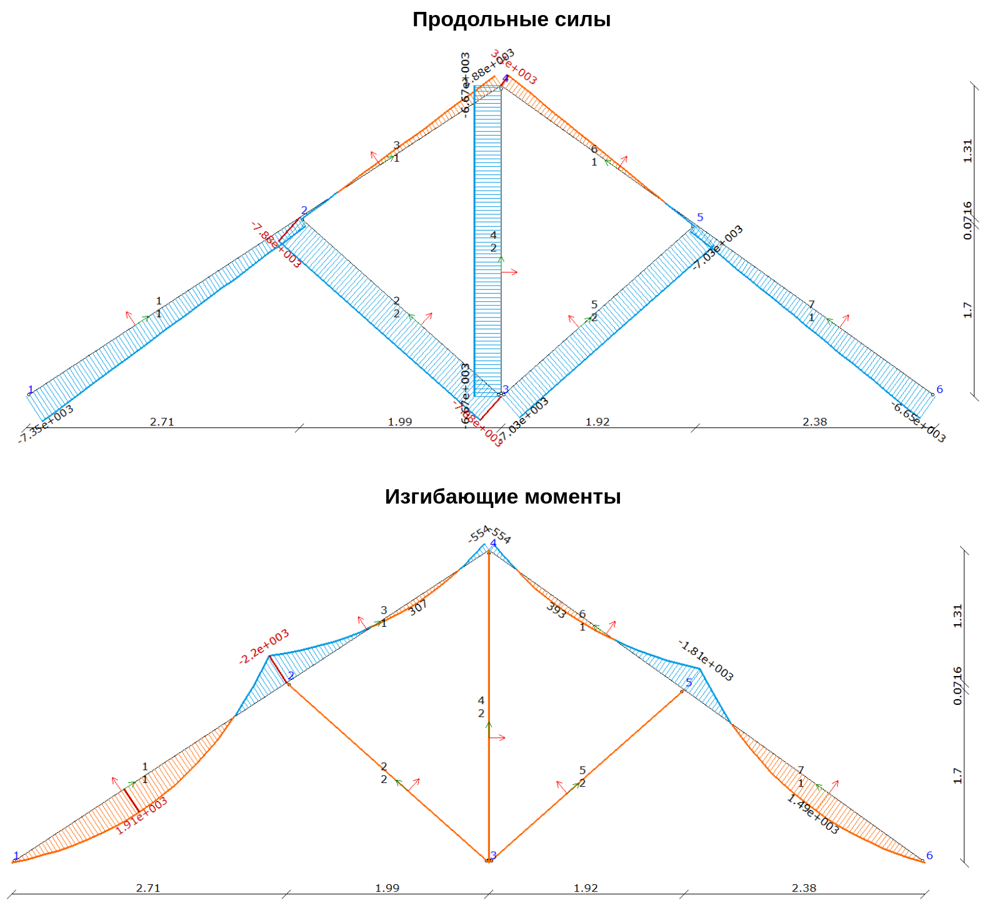

Эпюры продольных сил наглядно показывают, какие элементы являются сжатыми (синий), а какие растянутыми (красный). Растянутыми являются верхние части стропил (нагрузка тянет вниз).

Анализ эпюр продольных сил и изгибающих моментов позволяет выявить наиболее нагруженный элемент по совокупности этих двух факторов — это стержень 1 (нижний сегмент левой стропильной ноги).


### Сегмент стропильной ноги

Стропильные ноги (их сегменты) подвергаются внецентренному сжатию и растяжению. Рассматриваемый сегмент стропильной ноги подвергается внецентренному сжатию (на него действует продольная сила и изгибающий момент).

Эпюры усилий в этом элементе:

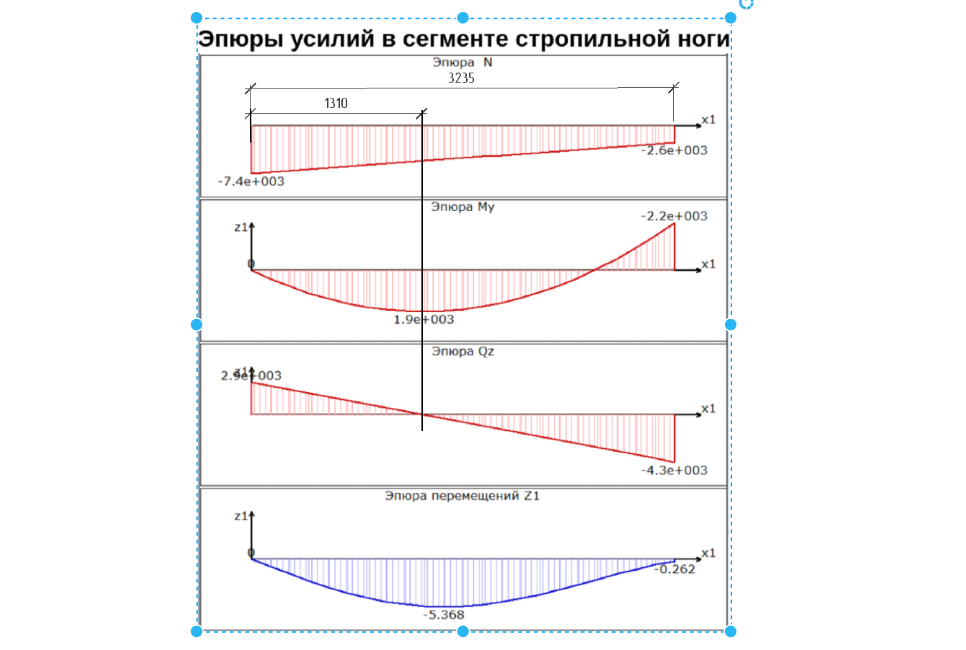

Самое напряженное место находится на расстоянии 1310 мм от левого края сегмента — сечение показано вертикальной синей линией. Величина изгибающего момента в этом месте максимальна и составляет $1.9 кН/м$. Величина продольной сжимающей силы может быть определена по формуле $\ref{eq5}$:

$
\begin{align}
\displaystyle
f = \frac{(f_{max} - f_{min})}{L} \cdot l + f_{min} \tag{5} \label{eq5},  \\
\end{align}
$

$
\begin{align}
\text{где  }& f_{max} \text{ - максимальное значение силы (левый край эпюры)} \\
& f_{min} \text{- минимальное значение силы (правый край эпюры)} \\
& L \text{- длина сегмента стропильной ноги} \\
& l \text{- расстояние от левого края сегмента до интересующего сечения}
\end{align}
$

In [4]:
fmax = 7400 # N
fmin = 2600 # N
L    = 3235 # mm
l    = 1310 # mm

f = (fmax - fmin)/L*l + fmin

print('f =', int(round(f)), 'N')

f = 4544 N


Расчёт на прочность сегмента стропильной ноги выполнен для продольной силы в расчётном сечении (где действует максимальный момент) и для максимальной величины, которая действует на конце сегмента (где момент равен 0):

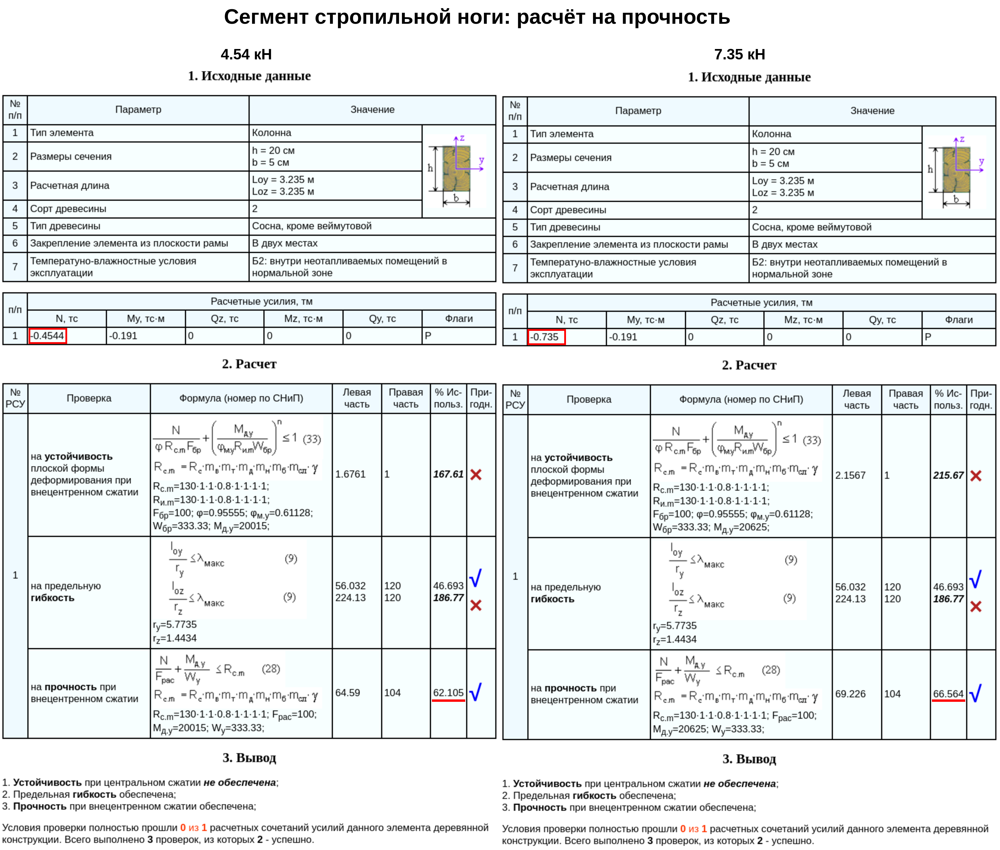

Результат расчёта показывает, что прочность при внецентренном сжатии обеспечена — это и есть главное искомое. На то, что расчёт на устойчивость плоской формы не удовлетворяет требованиям, обращать внимание не нужно: в данном случае стропильная ферма не является плоской формой, т.к. имеет фиксацию вдоль оси Y с помощью обрешётки. Точно так же и расчёт на предельную гибкость вокруг оси Z не следует принимать во внимание, т.е. стропильная нога в силу фиксации вдоль оси Y не изгибается вокруг оси Z.

Расчёт показывает, что прочность удовлетворяет даже для случая максимальной продольной силы, т.е. имеется существенный запас по прочности.

Т.к. остальные сегменты стропильных ног имеют меньшие по величине продольные силы, изгибающие моменты, являются более короткими нежели рассмотренный сегмент, то состояние этих элементов находится ещё дальше от предельного, поэтому производить расчёт на прочность для них является нецелесообразным.



### Центральная стойка

Центральная стойка является центрально сжатым элементом с силой $6.67 кН$. Расчёт на прочность для этого элемента при использовании того же материала выполнен для двух сечений одинаковой площади — $200\times50 мм$ и $100\times100 мм$. Длина стойки: $3.076м$:

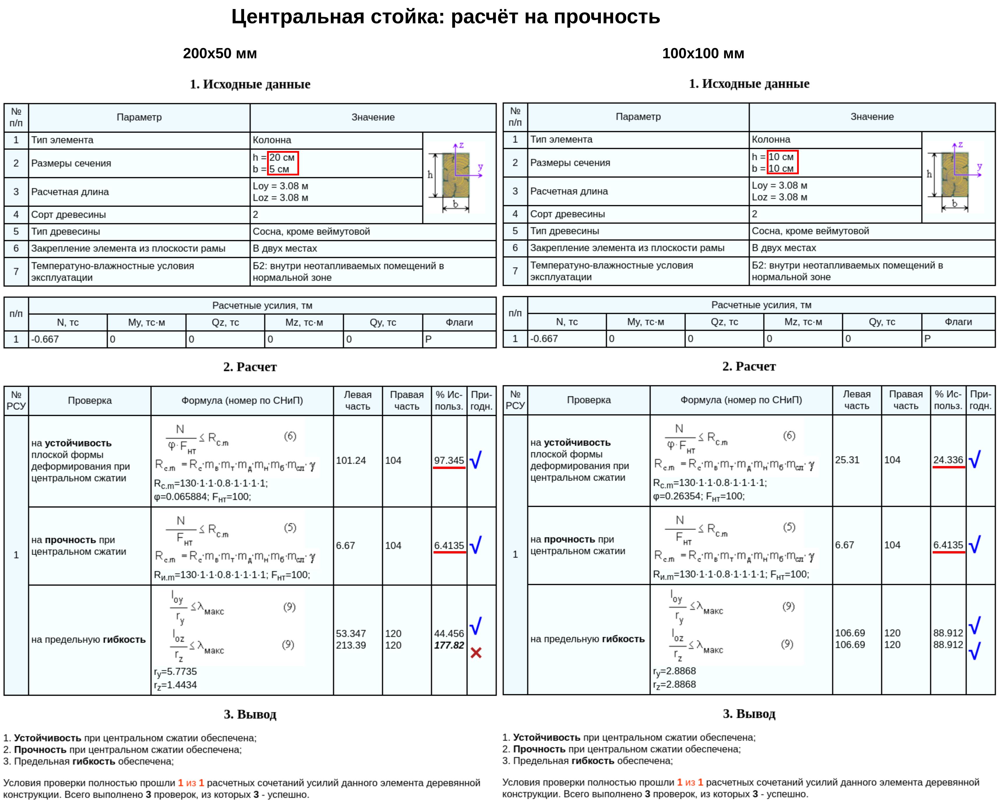

В данном случае уже нельзя игнорировать результаты расчёта на устойчивость плоской формы и предельную гибкость по любой из осей, т.к. стойка не имеет никакой фиксации по длине, закреплена только на концах. 

Из расчёта можно видеть, что прочность и усточивость при центральном сжатии обеспечена для обоих случаев. Это означает, что площадь поперечного сечения стойки достаточна для того, чтобы воспринимать нагрузку. Однако, также, можно заметить, что запас по усточивости для случая $200\times50 мм$ практически отсутствует (коэффициент использования 97%) — это косвенно подтверждается нарушением предельной гибкости для одного из направлений сечения. Таким образом, предпочтительным является вариант сечения $100\times100 мм$ — объём материала такой же, но прочностные характеристики (на устойчивость) значительно лучше.


### Подкосы

Подкосы по типу нагружения являются, как и стойка, центрально сжатыми элементами. Наиболее нагруженным элементом является левый подкос — он подвергается большему усилию, нежели правый, и он длиннее. При этом данный элемент короче центральной стойки — $2.633 м$ против $3.076 м$, но продольная сила, действующая на него, больше таковой, действующей на центральную стойку — $7.35 кН$ против $6.67 кН$. Т.е. режим работы и усилия для подкоса приблизительно такие же, как и для центральной стойки. Оценивая запас прочности и устойчивости для центральной стойки, при меньшей длине подкоса имеет смысл рассмотреть варианта с меньшим сечением. Расчёт подкоса на прочность для двух сечений:

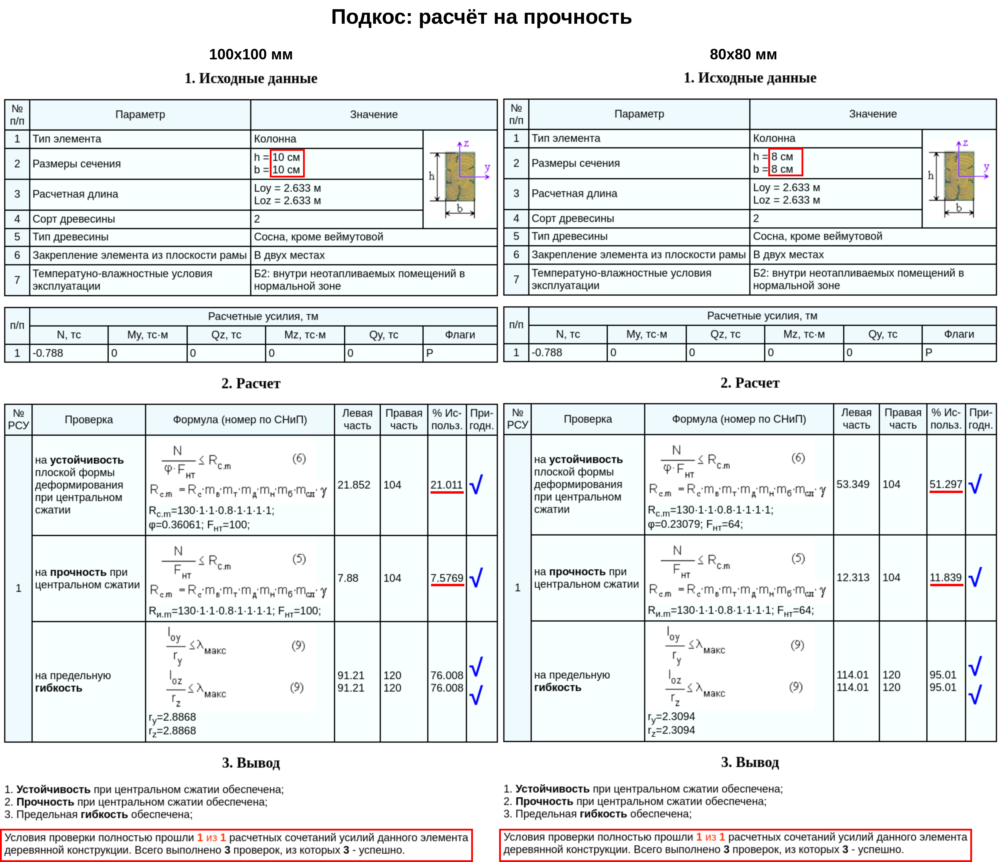

Расчёт показывает, что оба варианта удовлетворяют требованиям, хотя $80\times80 мм$ закономерно обладает заметно меньшим запасом.

## Ветровые нагрузки

### Исходные данные

Расчёт ветровых нагрузок необходим для того, чтобы опеределить воздействия на элементы крыши с целью предотвращения её разрушения. Наиболее вероятным и опасным является отрывание крыши от коробки дома. На это влияет ветровое давление как от парусного воздействия (преимуществевенно влияет на высокие крыши), так и от подъёмного из-за возникающей разреженности с подветренной стороны, когда ветер дует поперёк скатов крыши, а также из-за подъёмной силы, создаваемой под карнизами крыши (особенно на углах) при направлении ветра со стороны фронтонов.

Расчёт ветровых нагрузок ведётся в соответствии с СП 20.13330.2016. Нормативное значение средней составляющей ветровой нагрузки $\omega_{m}$ в зависимости от эквивалентной высоты $z_{e}$ определяется по формуле:

$$
\begin{align}
\omega_{m} = \omega_{0}k(z_{e})c\gamma_{f},  & \\
& \text{  где:} & \\
& \omega_{0} - \text{нормативное значение, см. Таблица 11.1 СП 20.13330.2016} \\
&  k(z_{e})  - \text{коэффициент изменения ветрового давления от высоты} \\
&  c         - \text{аэродинамический коэффициент, см. Приложение Д.1 СП 20.13330.2016} \\
&  \gamma_{f}- \text{коэффициент надёжности по нагрузке, равен 1.4} \\
\end{align}
$$

### Нормативное значение ветрового давления и коэффициент влияния высоты:

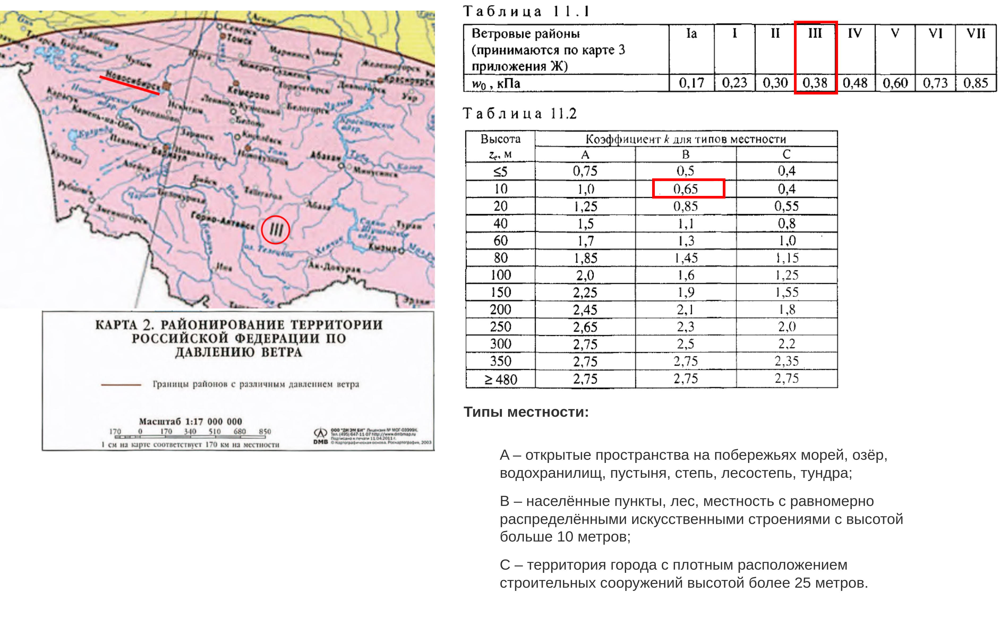

Согласно карте и таблицам для рассматриваемого случая значение нормативного ветрового давления составляет $0.6 кПа$, а коэффициент влияния высоты (местность В, высота $5 \lt z_{e} \le 10 м$) — $0.65$ (высота дома порядка $7м$ от нулевой отметки цоколя).

### Определение аэродинамического коэффициента

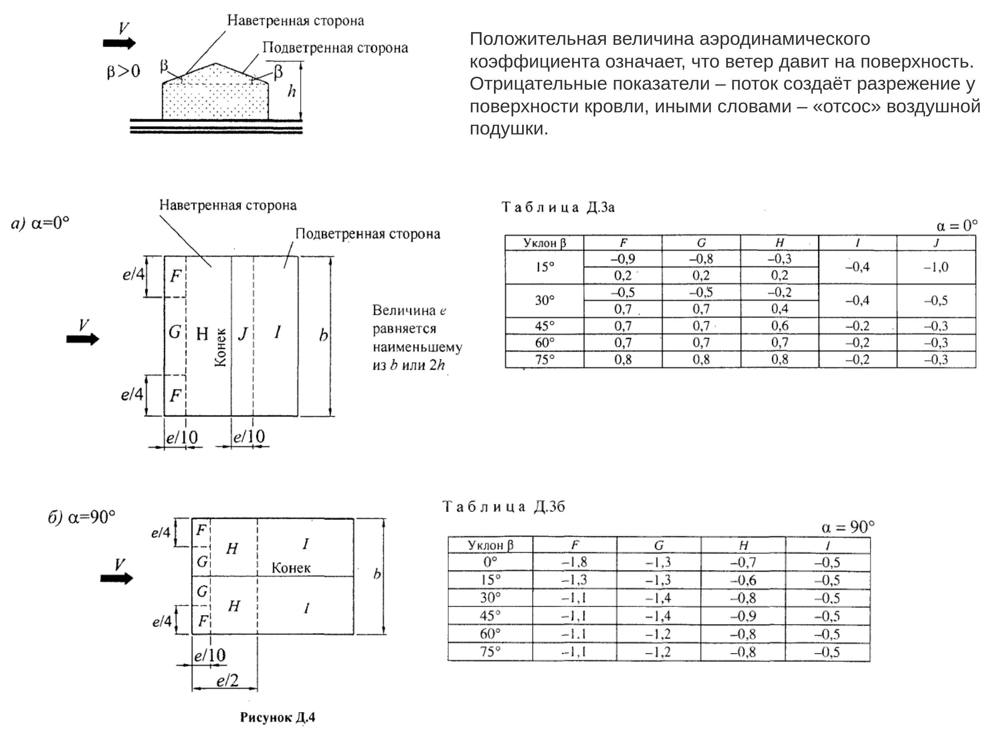

Наиболее опасными воздействиями являются те, которые стремятся оторвать крышу от стен дома, поэтому следует выбирать наибольший по модулю коэффициент с отрицательным знаком. Согласно таблице Д.3б таких зон на крыше присутствуует две: при направлении ветра со стороны фронтона — это зоны $F$ и $G$ с коэффициентами $-1.1$ и $-1.4$, соответственно.

### Расчёт нагрузки на крышу

По формуле для расчёта ветровой нагрузки $\omega_{m}$ определяются величины для зон $F$ и $G$:

In [25]:
w0 = 0.38 # kPa
k  = 0.65
c_f  = -1.1
c_g  = -1.4
c_h  = -0.8
y  = 1.4
w_f = w0*k*c_f*y
w_g = w0*k*c_g*y
w_h = w0*k*c_h*y

print('w_f = {:.3f} kPa -> {:.2f} kg/m^2'.format( round(w_f, 3) , round(w_f*100, 2) ) )
print('w_g = {:.3f} kPa -> {:.2f} kg/m^2'.format( round(w_g, 3) , round(w_g*100, 2) ) )
print('w_h = {:.3f} kPa -> {:.2f} kg/m^2'.format( round(w_h, 3) , round(w_h*100, 2) ) )


w_f = -0.380 kPa -> -38.04 kg/m^2
w_g = -0.484 kPa -> -48.41 kg/m^2
w_h = -0.277 kPa -> -27.66 kg/m^2


### Расчёт усилий на элементы стропильной системы

Из требоваий СП 20.13330.2016 следует, что наиболее нагруженные элементы крыши — это зоны $F$ $G$. Эти зоны находятся на краях крыши, поэтому наибольшие нагрузки испытывают крайние элементы (фермы) стропильной системы. На них действуют распределённые силы:

* $\omega_{f} = 380 Pa$ — преимущественно на нижние сегменты стропильных ног;
* $\omega_{g} = 484 Pa$ — на верхние сегменты стропильных ног.

Результаты расчёта для этих элементов — продольные силы и изгибающие моменты показаны по деформированной схеме:

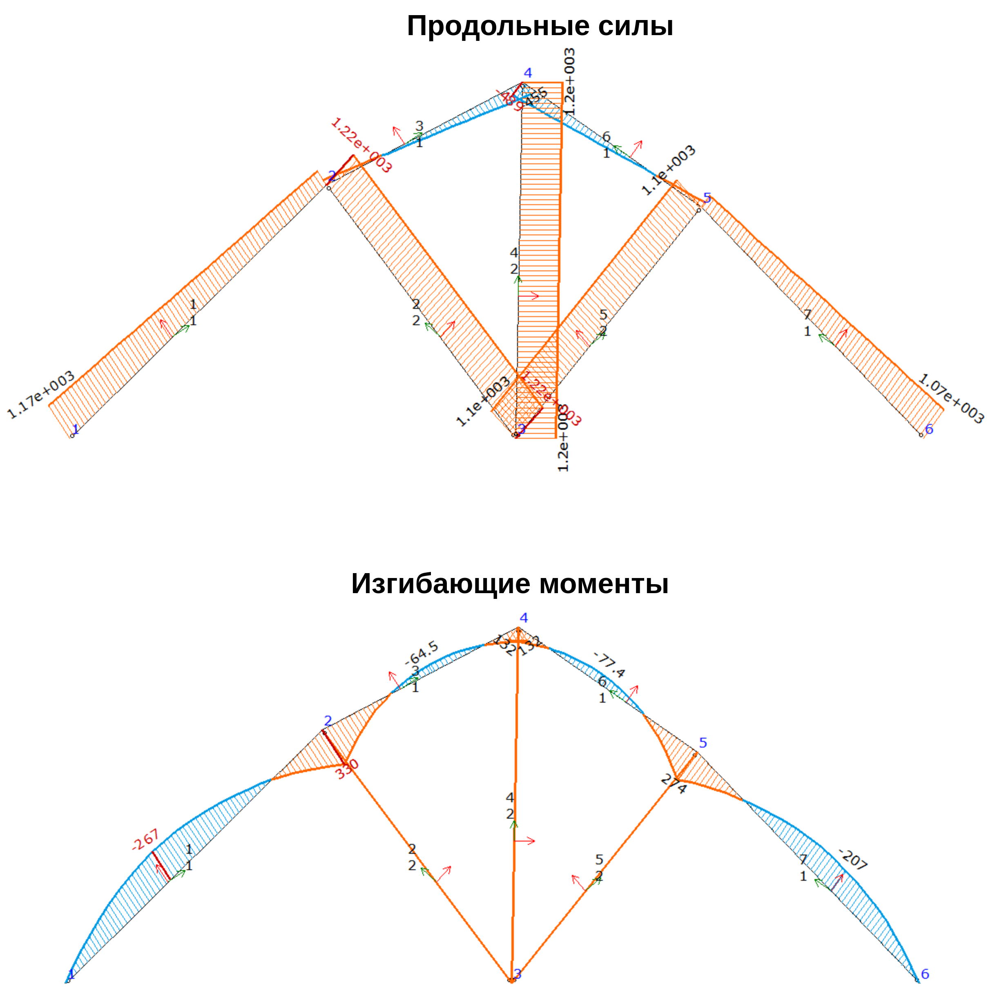

Силы в опорных узлах:

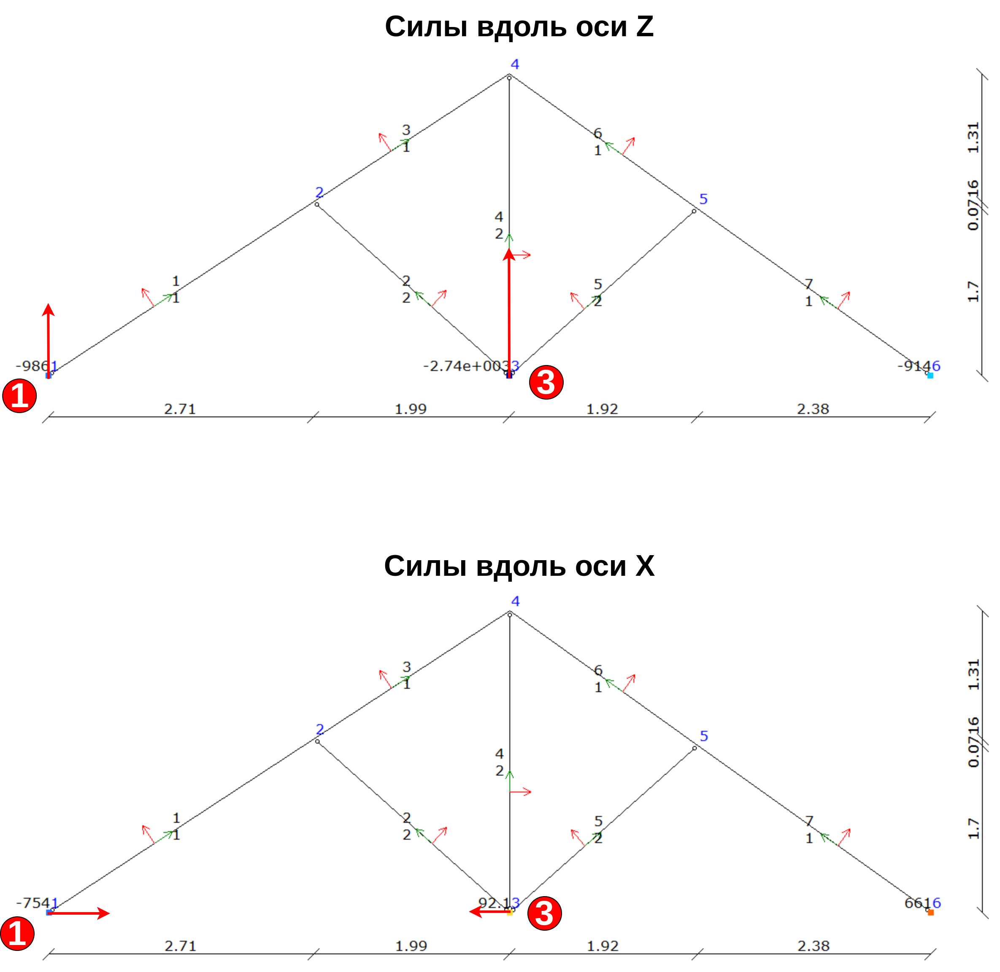

Наиболее нагруженными являются узлы $(1)$ и $(3)$. Результирующая сила определяетя как корень из суммы квадратов сил по осям $X$ и $Z$:

In [17]:
import math

f1x = 0.754  # kN
f1z = 0.986  # kN

f3x = 0.092  # kN
f3z = 2.74   # kN

f1 = math.sqrt(f1x**2 + f1z**2)
f3 = math.sqrt(f3x**2 + f3z**2)

print( 'f1 = {force_N:.3f} kN -> {force_kg:.1f} kg'.format( force_N=round(f1, 3), force_kg=round(f1*1000/9.8, 1) ) )
print( 'f3 = {force_N:.3f} kN -> {force_kg:.1f} kg'.format( force_N=round(f3, 3), force_kg=round(f3*1000/9.8, 1) ) )

print('H1 =', round(f1*1000/(9.8*0.25*2000)*1000, ), 'мм') # see below
print('H3 =', round(f3*1000/(9.8*0.25*2000)*1000, ), 'мм') # see below

f1 = 1.241 kN -> 126.7 kg
f3 = 2.742 kN -> 279.7 kg
H1 = 253 мм
H3 = 559 мм


Таким образом, сила на отрыв стропильной ноги от внешней стены дома составляет $1.24 кН (127 кгс)$. Этому усилию противостоит вес верхнего участка стены, который участвует в закреплении — например, при фиксации стропильной  ноги к стене с помощью анкера и проволоки:

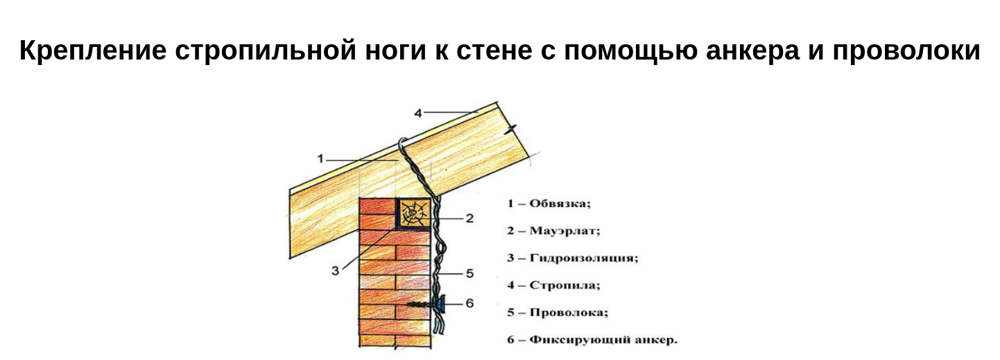

При толщине кладки $250мм$ и её плотности $2000 кг/м^{3}$ балластная высота верхнего участка стены (т.е. расстояние от верхней кромки вниз до точки забивания анкера) составляет:

$$
H1 = \frac{f_{1}}{W\cdot\rho} = \frac{1240}{0.25\cdot2000} = 253 мм
$$

Для зоны $G$:
 
$$
H3 = \frac{f_{3}}{W\cdot\rho} = \frac{2742}{0.25\cdot2000} = 559 мм
$$

Т.к. зона $G$ находится рядом с боковой стеной дома в районе внутренней несущей стены, то балластная нагрузка там больше, т.к. стык стен эффективно увеличивает объём материала в полтора-два раза, поэтому расстояние можно уменьших в такое же количество раз — $300-400 мм$ от верхней кромки стены до анкера. Кроме того, армопояс так же является усиливающим элементов — он скрепляет большой пролёт стены и сам по себе имеет плотность выше, чем кладка.
